In [1]:
import os # 환경 변수나 디렉터리, 파일 등의 OS 자원을 제어할 수 있게 해주는 모듈
import cv2 # OpenCV라이브러리 → 컴퓨터 비전 관련 프로그래밍을 쉽게 할 수 있도록 도와주는 라이브러리
import matplotlib.pyplot as plt # 다양한 데이터를 많은 방법으로 도식화 할 수 있도록 하는 라이브러리
import numpy as np # 다차원 배열을 쉽게 처리하고 효율적으로 사용할 수 있도록 하는 라이브러리
import dlib # 이미지 처리 및 기계 학습, 얼굴인식 등을 할 수 있는 c++ 로 개발된 고성능의 라이브러리 


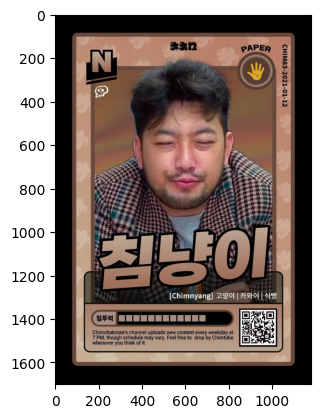

In [2]:
my_image_path = '/home/gnorm42/study_ipynb/aiffel_landmark/data/1714320122551-oqq3pdlw08a.jpg' 
img_bgr = cv2.imread(my_image_path) 
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_main= img_rgb.copy()
plt.imshow(img_rgb) # 이미지 실제 출력하기 위해 이미지를 올려줌 (원하는 사이즈의 픽셀을 원하는 색으로 채워서 만든 그림이라고 합니다.)
plt.show() # 이미지 실제 출력

In [3]:
detector_hog = dlib.get_frontal_face_detector() # 기본 얼굴 감지기를 반환
dlib_rects = detector_hog(img_rgb, 1)   # (image, num of image pyramid)

rectangles[[(418, 461) (803, 846)]]


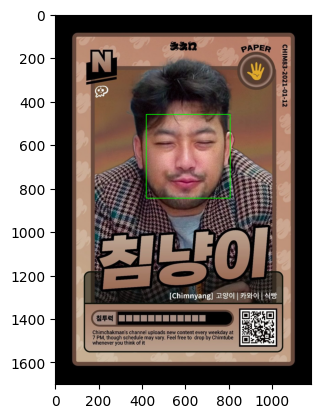

In [4]:
print(dlib_rects)   

for dlib_rect in dlib_rects: # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left() # 왼쪽
    t = dlib_rect.top() # 위쪽
    r = dlib_rect.right() # 오른쪽
    b = dlib_rect.bottom() # 아래쪽

    cv2.rectangle(img_rgb, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA) # 시작점의 좌표와 종료점 좌표로 직각 사각형을 그림

plt.imshow(img_rgb)
plt.show()

In [5]:
model_path = '/home/gnorm42/study_ipynb/aiffel_landmark/models/shape_predictor_68_face_landmarks.dat'
    # 저장한 landmark 모델의 주소를 model_path 변수에 저장
landmark_predictor = dlib.shape_predictor(model_path)
    # dlib 라이브러리의 shape_predictor 함수를 이용하여 모델을 불러옴
    # landmark_predictor는 RGB이미지와 dlib.rectangle를 입력 받고 dlib.full_object_detection를 반환
    # dlib.rectangle: 내부를 예측하는 박스
    # dlib.full_object_detection: 각 구성 요소의 위치와, 이미지 상의 객체의 위치를 나타냄

In [6]:
list_landmarks = []
    # 랜드마크의 위치를 저장할 list 생성    

# 얼굴 영역 박스 마다 face landmark를 찾아냅니다
# face landmark 좌표를 저장해둡니다
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
        # 모든 landmark의 위치정보를 points 변수에 저장
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
        # 각각의 landmark 위치정보를 (x,y) 형태로 변환하여 list_points 리스트로 저장
    list_landmarks.append(list_points)
        # list_landmarks에 랜드마크 리스트를 저장

print(len(list_landmarks[0]))
    # 얼굴이 n개인 경우 list_landmarks는 n개의 원소를 갖고
    # 각 원소는 68개의 랜드마크 위치가 나열된 list 
    # list_landmarks의 원소가 1개이므로 list_landmarks[1]을 호출하면 IndexError가 발생

68


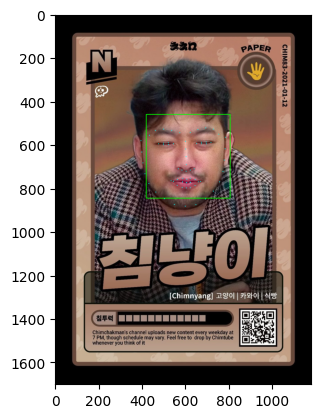

In [7]:
# list_landmarks의 원소가 1개이므로 아래 반복문은 한번만 실행됨
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_rgb, point, 2, (0, 255, 255), -1)
            # cv2.circle: OpenCV의 원을 그리는 함수
            # img_show 이미지 위 각각의 point에
            # 크기가 2이고 (0, 255, 255)색으로 내부가 채워진(-1) 원을 그림
            # (마지막 인수가 자연수라면 그만큼의 두께의 선으로 원이 그려짐)

plt.imshow(img_rgb)
    # 이미지를 준비
plt.show()
    # 이미지를 출력

In [8]:
# zip() : 두 그룹의 데이터를 서로 엮어주는 파이썬의 내장 함수
# dlib_rects와 list_landmarks 데이터를 엮어 주었음
# dlib_rects : 얼굴 영역을 저장하고 있는 값
# → rectangles[[(345, 98) (531, 284)]]
# list_landmarks : 68개의 랜드마크 값 저장(이목구비 위치(x,y))
# → [[(368, 153), (368, 174), (371, 195), (376, 215), (382, 235), (391, 252), (404, 266), (420, 277), (441, 279), (461, 276), (480, 266), (495, 252), (508, 235), (516, 216), (520, 195), (523, 173), (524, 151), (377, 131), (386, 119), (399, 116), (413, 118), (425, 124), (454, 121), (466, 114), (481, 112), (494, 114), (503, 127), (439, 143), (438, 156), (438, 169), (437, 182), (423, 197), (431, 199), (438, 200), (446, 199), (454, 197), (391, 147), (399, 142), (409, 143), (416, 149), (408, 150), (399, 150), (464, 147), (472, 141), (482, 141), (489, 145), (482, 149), (473, 149), (411, 227), (421, 222), (432, 218), (439, 220), (446, 218), (458, 222), (471, 227), (458, 234), (446, 238), (438, 238), (431, 238), (420, 235), (415, 227), (432, 227), (439, 228), (447, 227), (466, 227), (446, 228), (438, 229), (431, 228)]]

for dlib_rect, landmark in zip(dlib_rects, list_landmarks): # 얼굴 영역을 저장하고 있는 값과 68개의 랜드마크를 저장하고 있는 값으로 반복문 실행
    print (landmark[30]) # 코의 index는 30 입니다
    x = landmark[30][0] # 이미지에서 코 부위의 x값
    y = landmark[30][1] + dlib_rect.height()//2 # 이미지에서 코 부위의 y값 - 얼굴 영역의 세로를 차지하는 픽셀의 수//2 → (437, 182-(186+1//2))
    w = h = dlib_rect.width() # 얼굴 영역의 가로를 차지하는 픽셀의 수 (531-345+1) → max(x) - min(x) +1(픽셀의 수 이기 때문에 1을 더해줌 → 픽셀 수는 점 하나로도 1이 됨)
    print (f'(x,y) : ({x},{y})')
    print (f'(w,h) : ({w},{h})')

(602, 691)
(x,y) : (602,884)
(w,h) : (386,386)


In [9]:
sticker_path = '/home/gnorm42/study_ipynb/aiffel_landmark/data/cat-whiskers.png' # 왕관 이미지의 경로
img_sticker = cv2.imread(sticker_path) # 스티커 이미지를 불러옵니다 // cv2.imread(이미지 경로) → image객체 행렬을 반환
img_sticker = cv2.resize(img_sticker, (w,h)) # 스티커 이미지 조정 → w,h는 얼굴 영역의 가로를 차지하는 픽셀의 수(187) // cv2.resize(image객체 행렬, (가로 길이, 세로 길이))
print (img_sticker.shape) # 사이즈를 조정한 왕관 이미지의 차원 확인

(386, 386, 3)


In [10]:
# x,y,w,h 모두 위에서 반복문 안에서 지정해준 값임
# x는 이미지에서 코 부위의 x값 = 437
# y는 이미지에서 코 부위의 y값 = 89
# w는 얼굴 영역의 가로를 차지하는 픽셀의 수 = 187
# h는 얼굴 영역의 가로를 차지하는 픽셀의 수 = 187
refined_x = x - w // 2 # 437 - (187//2) = 437-93 = 344
refined_y = y - h # 89-187 = -98
# 원본 이미지에 스티커 이미지를 추가하기 위해서 x, y 좌표를 조정합니다. 이미지 시작점은 top-left 좌표이기 때문입니다.
# 즉, refined_x, refined_y값에서 왕관 이미지가 시작됨
print (f'(x,y) : ({refined_x},{refined_y})') # 음수 발생 : 이미지 범위를 벗어남
# 우리는 현재 이마 자리에 왕관을 두고 싶은건데, 이마위치 - 왕관 높이를 했더니 이미지의 범위를 초과하여 음수가 나오는 것
# opencv는 ndarray데이터를 사용하는데, ndarray는 음수인덱스에 접근 불가하므로 스티커 이미지를 잘라 줘야 한다.

(x,y) : (409,498)


In [11]:
# 왕관 이미지가 이미지 밖에서 시작하지 않도록 조정이 필요함
# 좌표 순서가 y,x임에 유의한다. (y,x,rgb channel)
# 현재 상황에서는 -y 크기만큼 스티커를 crop 하고, top 의 x좌표와 y 좌표를 각각의 경우에 맞춰 원본 이미지의 경계 값으로 수정하면 아래와 같은 형식으로 나옵니다.
# 음수값 만큼 왕관 이미지(혹은 추후 적용할 스티커 이미지)를 자른다.
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
# 왕관 이미지를 씌우기 위해 왕관 이미지가 시작할 y좌표 값 조정
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :] # refined_y가 -98이므로, img_sticker[98: , :]가 된다. (187, 187, 3)에서 (89, 187, 3)이 됨 (187개 중에서 98개가 잘려나감)
    refined_y = 0

print (f'(x,y) : ({refined_x},{refined_y})')

(x,y) : (409,498)


In [12]:
# sticker_area는 원본이미지에서 스티커를 적용할 위치를 crop한 이미지 입니다.
# 예제에서는 (344,0) 부터 (344+187, 0+89) 범위의 이미지를 의미합니다.
# 좌표 순서가 y,x임에 유의한다. (y,x,rgb channel)
# img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
# img_show[0:0+89, 344:344+187]
# img_show[0:89, 344:531]
# 즉, x좌표는 344~531 / y좌표는 0~89가 됨
sticker_area = img_rgb[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
# 왕관 이미지에서 사용할 부분은 0이 아닌 색이 있는 부분을 사용합니다.
# 왕관 이미지에서 0이 나오는 부분은 흰색이라는 뜻, 즉 이미지가 없다는 소리임.
# 현재 왕관 이미지에서는 왕관과 받침대 밑의 ------ 부분이 됨
# 그렇기 때문에 0인 부분(이미지가 없는 부분)은 제외하고 적용
# sticker_area는 원본 이미지에서 스티커를 적용할 위치를 미리 잘라낸 이미지입니다.
# 즉, 왕관 이미지에서 왕관 이미지가 없는 부분(왕관과 받침대 밑의 ------ 부분)은 원본 이미지에서 미리 잘라놓은 sticker_area(스티커 적용할 부분 만큼 원본 이미지에서 자른 이미지)를 적용하고,
# 나머지 부분은 스티커로 채워주면 됨
# np.where는 조건에 해당하는 인덱스만 찾아서 값을 적용하는 방법이다.
# 아래 코드에서는 img_sticker가 0일 경우(왕관 이미지에서 왕관 부분 제외한 나머지 이미지)에는 sticker_area(원본 이미지에서 스티커를 적용할 위치를 미리 잘라낸 이미지)를 적용하고,
# 나머지 부분은 img_sticker(왕관 이미지)를 적용한다.
img_rgb[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)

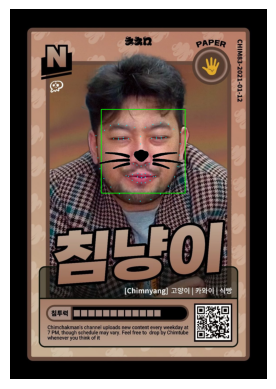

In [13]:
# 왕관 이미지를 적용한 이미지를 보여준다.
# 얼굴 영역(7-3)과 랜드마크(7-4)를 미리 적용해놓은 img_show에 왕관 이미지를 덧붙인 이미지가 나오게 된다.)
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

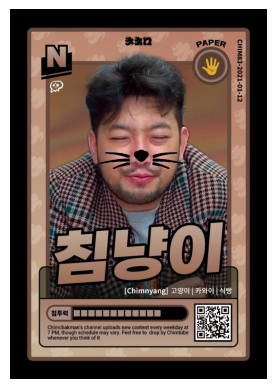

In [14]:
sticker_area = img_main[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
img_main[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==255,sticker_area,img_sticker).astype(np.uint8)
plt.imshow(img_main)
plt.axis('off')
plt.show()

# 눈을 감고 있어도 적용 확인

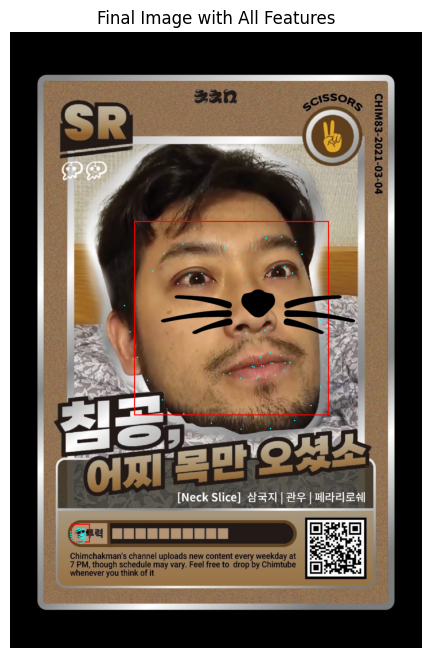

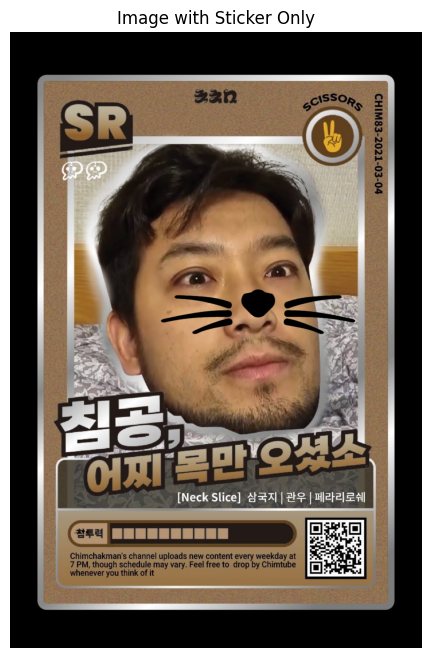

In [5]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib

# 이미지 경로 설정
img_path = "/home/gnorm42/study_ipynb/aiffel_landmark/data/1714320122983-jqv11okdyui.jpg"
sticker_path = "/home/gnorm42/study_ipynb/aiffel_landmark/data/cat-whiskers.png"

# 얼굴 인식을 위한 dlib 객체 생성
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('/home/gnorm42/study_ipynb/aiffel_landmark/models/shape_predictor_68_face_landmarks.dat')

# 이미지 읽기
img_origin = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_origin, cv2.COLOR_BGR2RGB)

# 스티커 이미지 읽기
img_sticker = cv2.imread(sticker_path, cv2.IMREAD_UNCHANGED)
img_sticker = cv2.cvtColor(img_sticker, cv2.COLOR_BGRA2RGBA)

# 얼굴 인식
dlib_rects = detector(img_rgb, 1)

# 랜드마크 검출을 위한 리스트
list_landmarks = []

# 랜드마크 검출
for dlib_rect in dlib_rects:
    points = predictor(img_rgb, dlib_rect)
    list_points = list(map(lambda p: [p.x, p.y], points.parts()))
    list_landmarks.append(list_points)

# 이미지 복사
img_main = img_rgb.copy()

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    # 얼굴 영역 박스 그리기 (img_rgb에만)
    x = dlib_rect.left()
    y = dlib_rect.top()
    w = dlib_rect.right() - dlib_rect.left()
    h = dlib_rect.bottom() - dlib_rect.top()
    cv2.rectangle(img_rgb, (x,y), (x+w,y+h), (255,0,0), 2)

    # 랜드마크 점 그리기 (img_rgb에만)
    for point in landmark:
        cv2.circle(img_rgb, tuple(point), 2, (0,255,255), -1)

    # 스티커 적용 (img_rgb와 img_main 모두에)
    x = landmark[30][0]  # 코의 x좌표
    y = landmark[30][1] # 중앙 좌표로 적용하기 때문에 코의 y좌표를 그대로 사용
    w = h = dlib_rect.width()  # 스티커 크기
    
    # 스티커 리사이즈
    img_sticker_resized = cv2.resize(img_sticker, (w, h))
    
    # 스티커 적용 영역 계산
    y1, y2 = y - h//2, y + h//2
    x1, x2 = x - w//2, x + w//2
    
    # 이미지 범위 확인
    if x1 < 0: x1 = 0
    if y1 < 0: y1 = 0
    if x2 > img_rgb.shape[1]: x2 = img_rgb.shape[1]
    if y2 > img_rgb.shape[0]: y2 = img_rgb.shape[0]
    
    # 스티커 크기 조정
    sticker_area = img_sticker_resized[0:y2-y1, 0:x2-x1]
    
    # 알파 채널이 있는 경우 마스크 생성
    if sticker_area.shape[2] == 4:
        alpha_channel = sticker_area[:, :, 3] / 255.0
        alpha_3channel = np.stack([alpha_channel, alpha_channel, alpha_channel], axis=2)
        
        # 스티커 적용 (img_rgb에는 박스와 랜드마크가 그려진 후에 스티커 적용)
        img_rgb[y1:y2, x1:x2] = (1 - alpha_3channel) * img_rgb[y1:y2, x1:x2] + alpha_3channel * sticker_area[:, :, :3]
        # img_main에는 스티커만 적용
        img_main[y1:y2, x1:x2] = (1 - alpha_3channel) * img_main[y1:y2, x1:x2] + alpha_3channel * sticker_area[:, :, :3]

# 원본 파일명에서 새로운 파일명 생성
original_filename = os.path.basename(img_path)
output_filename = f"st_{original_filename}"
output_path = os.path.join("output", output_filename)

# output 디렉토리 생성 및 이미지 저장
os.makedirs("output", exist_ok=True)
cv2.imwrite(output_path, cv2.cvtColor(img_main, cv2.COLOR_RGB2BGR))

# 결과 출력 (따로따로)
plt.figure(figsize=(8, 8))
plt.title('Final Image with All Features')
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

plt.figure(figsize=(8, 8))
plt.title('Image with Sticker Only')
plt.imshow(img_main)
plt.axis('off')
plt.show() 

# 각도가 틀어지니 스티커 사진이 어색한 문제 발생. 왼쪽 눈과 오른쪽 눈의 위치 차이로 계산 방식 추가

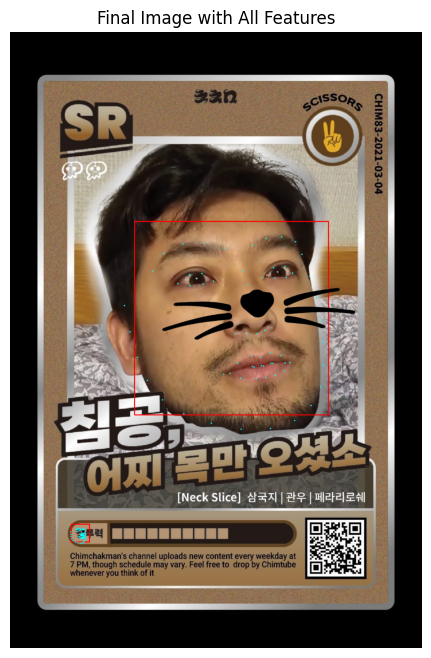

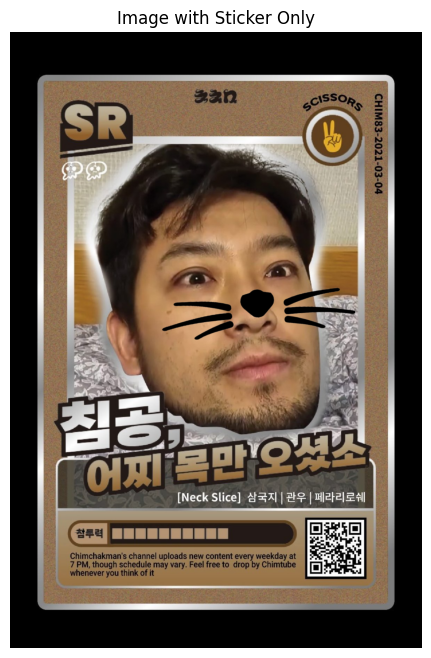

In [7]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib

# 이미지 경로 설정
img_path = "/home/gnorm42/study_ipynb/aiffel_landmark/data/1714320122983-jqv11okdyui.jpg"
sticker_path = "/home/gnorm42/study_ipynb/aiffel_landmark/data/cat-whiskers.png"

# 얼굴 인식을 위한 dlib 객체 생성
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('/home/gnorm42/study_ipynb/aiffel_landmark/models/shape_predictor_68_face_landmarks.dat')

# 이미지 읽기
img_origin = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_origin, cv2.COLOR_BGR2RGB)

# 스티커 이미지 읽기
img_sticker = cv2.imread(sticker_path, cv2.IMREAD_UNCHANGED)
img_sticker = cv2.cvtColor(img_sticker, cv2.COLOR_BGRA2RGBA)

# 얼굴 인식
dlib_rects = detector(img_rgb, 1)

# 랜드마크 검출을 위한 리스트
list_landmarks = []

# 랜드마크 검출
for dlib_rect in dlib_rects:
    points = predictor(img_rgb, dlib_rect)
    list_points = list(map(lambda p: [p.x, p.y], points.parts()))
    list_landmarks.append(list_points)

# 이미지 복사
img_main = img_rgb.copy()

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    # 얼굴 영역 박스 그리기 (img_rgb에만)
    x = dlib_rect.left()
    y = dlib_rect.top()
    w = dlib_rect.right() - dlib_rect.left()
    h = dlib_rect.bottom() - dlib_rect.top()
    cv2.rectangle(img_rgb, (x,y), (x+w,y+h), (255,0,0), 2)

    # 랜드마크 점 그리기 (img_rgb에만)
    for point in landmark:
        cv2.circle(img_rgb, tuple(point), 2, (0,255,255), -1)

    # 스티커 적용 (img_rgb와 img_main 모두에)
    x = landmark[30][0]  # 코의 x좌표
    y = landmark[30][1]  # 코의 y좌표
    w = h = dlib_rect.width()  # 스티커 크기
    
    # 얼굴 각도 계산 (왼쪽 눈과 오른쪽 눈의 위치로 계산)
    left_eye = landmark[36]  # 왼쪽 눈 좌표
    right_eye = landmark[45]  # 오른쪽 눈 좌표
    
    # 두 눈의 중심점 사이의 각도 계산
    dY = right_eye[1] - left_eye[1]
    dX = right_eye[0] - left_eye[0]
    angle = np.degrees(np.arctan2(dY, dX)) * -1  # 각도에 -1을 곱해 반대 방향으로 회전
    
    # 스티커 리사이즈
    img_sticker_resized = cv2.resize(img_sticker, (w, h))
    
    # 회전을 위해 더 큰 캔버스 생성 (회전 시 잘림 방지)
    diagonal = int(np.sqrt(w*w + h*h))
    offset = (diagonal - w) // 2
    canvas = np.zeros((diagonal, diagonal, 4), dtype=np.uint8)
    canvas[offset:offset+h, offset:offset+w] = img_sticker_resized
    
    # 캔버스 중심으로 회전
    center = (diagonal//2, diagonal//2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    img_sticker_rotated = cv2.warpAffine(canvas, rotation_matrix, (diagonal, diagonal), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=(0,0,0,0))
    
    # 원래 크기로 자르기
    start_y = (diagonal - h) // 2
    start_x = (diagonal - w) // 2
    img_sticker_rotated = img_sticker_rotated[start_y:start_y+h, start_x:start_x+w]
    
    # 스티커 적용 영역 계산
    y1, y2 = y - h//2, y + h//2
    x1, x2 = x - w//2, x + w//2
    
    # 이미지 범위 확인
    if x1 < 0: x1 = 0
    if y1 < 0: y1 = 0
    if x2 > img_rgb.shape[1]: x2 = img_rgb.shape[1]
    if y2 > img_rgb.shape[0]: y2 = img_rgb.shape[0]
    
    # 스티커 크기 조정
    sticker_area = img_sticker_rotated[0:y2-y1, 0:x2-x1]
    
    # 알파 채널이 있는 경우 마스크 생성
    if sticker_area.shape[2] == 4:
        alpha_channel = sticker_area[:, :, 3] / 255.0
        alpha_3channel = np.stack([alpha_channel, alpha_channel, alpha_channel], axis=2)
        
        # 스티커 적용 (img_rgb에는 박스와 랜드마크가 그려진 후에 스티커 적용)
        img_rgb[y1:y2, x1:x2] = (1 - alpha_3channel) * img_rgb[y1:y2, x1:x2] + alpha_3channel * sticker_area[:, :, :3]
        # img_main에는 스티커만 적용
        img_main[y1:y2, x1:x2] = (1 - alpha_3channel) * img_main[y1:y2, x1:x2] + alpha_3channel * sticker_area[:, :, :3]

# 원본 파일명에서 새로운 파일명 생성
original_filename = os.path.basename(img_path)
output_filename = f"st_{original_filename}"
output_path = os.path.join("output", output_filename)

# output 디렉토리 생성 및 이미지 저장
os.makedirs("output", exist_ok=True)
cv2.imwrite(output_path, cv2.cvtColor(img_main, cv2.COLOR_RGB2BGR))

# 결과 출력 (따로따로)
plt.figure(figsize=(8, 8))
plt.title('Final Image with All Features')
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

plt.figure(figsize=(8, 8))
plt.title('Image with Sticker Only')
plt.imshow(img_main)
plt.axis('off')
plt.show() 

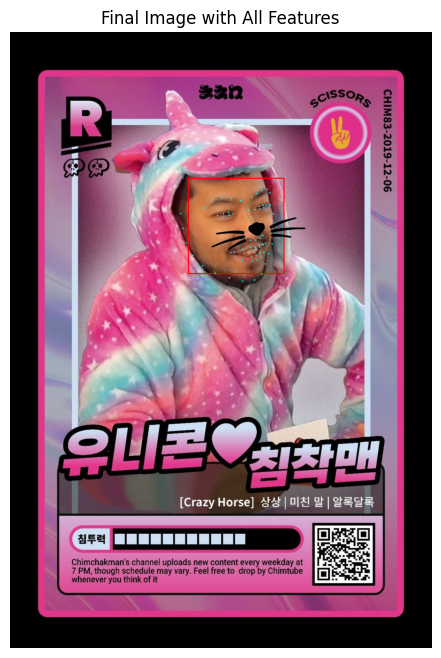

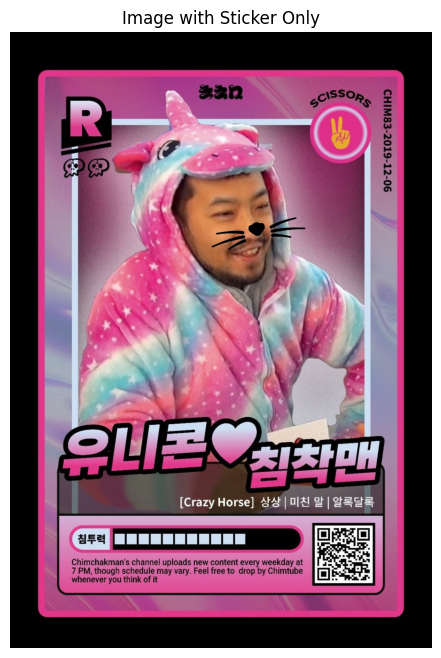

In [15]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib

# 이미지 경로 설정
img_path = "/home/gnorm42/study_ipynb/aiffel_landmark/data/1714320123000-qly7he1mwkh.jpg"
sticker_path = "/home/gnorm42/study_ipynb/aiffel_landmark/data/cat-whiskers.png"

# 얼굴 인식을 위한 dlib 객체 생성
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('/home/gnorm42/study_ipynb/aiffel_landmark/models/shape_predictor_68_face_landmarks.dat')

# 이미지 읽기
img_origin = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_origin, cv2.COLOR_BGR2RGB)

# 스티커 이미지 읽기
img_sticker = cv2.imread(sticker_path, cv2.IMREAD_UNCHANGED)
img_sticker = cv2.cvtColor(img_sticker, cv2.COLOR_BGRA2RGBA)

# 얼굴 인식
dlib_rects = detector(img_rgb, 1)

# 랜드마크 검출을 위한 리스트
list_landmarks = []

# 랜드마크 검출
for dlib_rect in dlib_rects:
    points = predictor(img_rgb, dlib_rect)
    list_points = list(map(lambda p: [p.x, p.y], points.parts()))
    list_landmarks.append(list_points)

# 이미지 복사
img_main = img_rgb.copy()

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    # 얼굴 영역 박스 그리기 (img_rgb에만)
    x = dlib_rect.left()
    y = dlib_rect.top()
    w = dlib_rect.right() - dlib_rect.left()
    h = dlib_rect.bottom() - dlib_rect.top()
    cv2.rectangle(img_rgb, (x,y), (x+w,y+h), (255,0,0), 2)

    # 랜드마크 점 그리기 (img_rgb에만)
    for point in landmark:
        cv2.circle(img_rgb, tuple(point), 2, (0,255,255), -1)

    # 스티커 적용 (img_rgb와 img_main 모두에)
    x = landmark[30][0]  # 코의 x좌표
    y = landmark[30][1]  # 코의 y좌표
    w = h = dlib_rect.width()  # 스티커 크기
    
    # 얼굴 각도 계산 (왼쪽 눈과 오른쪽 눈의 위치로 계산)
    left_eye = landmark[36]  # 왼쪽 눈 좌표
    right_eye = landmark[45]  # 오른쪽 눈 좌표
    
    # 두 눈의 중심점 사이의 각도 계산
    dY = right_eye[1] - left_eye[1]
    dX = right_eye[0] - left_eye[0]
    angle = np.degrees(np.arctan2(dY, dX)) * -1  # 각도에 -1을 곱해 반대 방향으로 회전
    
    # 스티커 리사이즈
    img_sticker_resized = cv2.resize(img_sticker, (w, h))
    
    # 회전을 위해 더 큰 캔버스 생성 (회전 시 잘림 방지)
    diagonal = int(np.sqrt(w*w + h*h))
    offset = (diagonal - w) // 2
    canvas = np.zeros((diagonal, diagonal, 4), dtype=np.uint8)
    canvas[offset:offset+h, offset:offset+w] = img_sticker_resized
    
    # 캔버스 중심으로 회전
    center = (diagonal//2, diagonal//2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    img_sticker_rotated = cv2.warpAffine(canvas, rotation_matrix, (diagonal, diagonal), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=(0,0,0,0))
    
    # 원래 크기로 자르기
    start_y = (diagonal - h) // 2
    start_x = (diagonal - w) // 2
    img_sticker_rotated = img_sticker_rotated[start_y:start_y+h, start_x:start_x+w]
    
    # 스티커 적용 영역 계산
    y1, y2 = y - h//2, y + h//2
    x1, x2 = x - w//2, x + w//2
    
    # 이미지 범위 확인
    if x1 < 0: x1 = 0
    if y1 < 0: y1 = 0
    if x2 > img_rgb.shape[1]: x2 = img_rgb.shape[1]
    if y2 > img_rgb.shape[0]: y2 = img_rgb.shape[0]
    
    # 스티커 크기 조정
    sticker_area = img_sticker_rotated[0:y2-y1, 0:x2-x1]
    
    # 알파 채널이 있는 경우 마스크 생성
    if sticker_area.shape[2] == 4:
        alpha_channel = sticker_area[:, :, 3] / 255.0
        alpha_3channel = np.stack([alpha_channel, alpha_channel, alpha_channel], axis=2)
        
        # 스티커 적용 (img_rgb에는 박스와 랜드마크가 그려진 후에 스티커 적용)
        img_rgb[y1:y2, x1:x2] = (1 - alpha_3channel) * img_rgb[y1:y2, x1:x2] + alpha_3channel * sticker_area[:, :, :3]
        # img_main에는 스티커만 적용
        img_main[y1:y2, x1:x2] = (1 - alpha_3channel) * img_main[y1:y2, x1:x2] + alpha_3channel * sticker_area[:, :, :3]

# 원본 파일명에서 새로운 파일명 생성
original_filename = os.path.basename(img_path)
output_filename = f"st_{original_filename}"
output_path = os.path.join("output", output_filename)

# output 디렉토리 생성 및 이미지 저장
os.makedirs("output", exist_ok=True)
cv2.imwrite(output_path, cv2.cvtColor(img_main, cv2.COLOR_RGB2BGR))

# 결과 출력 (따로따로)
plt.figure(figsize=(8, 8))
plt.title('Final Image with All Features')
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

plt.figure(figsize=(8, 8))
plt.title('Image with Sticker Only')
plt.imshow(img_main)
plt.axis('off')
plt.show() 

# 각도가 틀어졌을때 스티커의 각도는 해결했지만 좌우 위치가 어색한 문제. 30번이 아닌 33번을 x로 사용하니 적절함

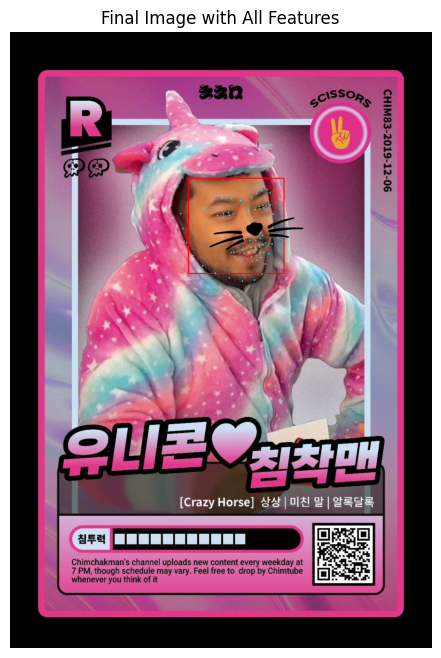

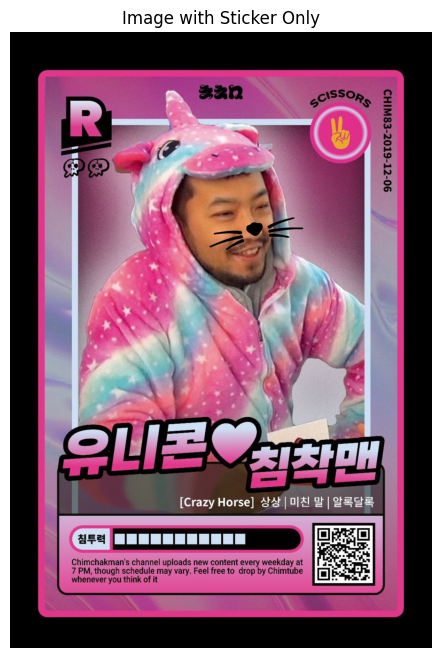

In [14]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib

# 이미지 경로 설정
img_path = "/home/gnorm42/study_ipynb/aiffel_landmark/data/1714320123000-qly7he1mwkh.jpg"
sticker_path = "/home/gnorm42/study_ipynb/aiffel_landmark/data/cat-whiskers.png"

# 얼굴 인식을 위한 dlib 객체 생성
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('/home/gnorm42/study_ipynb/aiffel_landmark/models/shape_predictor_68_face_landmarks.dat')

# 이미지 읽기
img_origin = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_origin, cv2.COLOR_BGR2RGB)

# 스티커 이미지 읽기
img_sticker = cv2.imread(sticker_path, cv2.IMREAD_UNCHANGED)
img_sticker = cv2.cvtColor(img_sticker, cv2.COLOR_BGRA2RGBA)

# 얼굴 인식
dlib_rects = detector(img_rgb, 1)

# 랜드마크 검출을 위한 리스트
list_landmarks = []

# 랜드마크 검출
for dlib_rect in dlib_rects:
    points = predictor(img_rgb, dlib_rect)
    list_points = list(map(lambda p: [p.x, p.y], points.parts()))
    list_landmarks.append(list_points)

# 이미지 복사
img_main = img_rgb.copy()

for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    # 얼굴 영역 박스 그리기 (img_rgb에만)
    x = dlib_rect.left()
    y = dlib_rect.top()
    w = dlib_rect.right() - dlib_rect.left()
    h = dlib_rect.bottom() - dlib_rect.top()
    cv2.rectangle(img_rgb, (x,y), (x+w,y+h), (255,0,0), 2)

    # 랜드마크 점 그리기 (img_rgb에만)
    for point in landmark:
        cv2.circle(img_rgb, tuple(point), 2, (0,255,255), -1)

    # 스티커 적용 (img_rgb와 img_main 모두에)
    x = landmark[33][0]  # 코의 x좌표
    y = landmark[30][1]  # 코의 y좌표
    w = h = dlib_rect.width()  # 스티커 크기
    
    # 얼굴 각도 계산 (왼쪽 눈과 오른쪽 눈의 위치로 계산)
    left_eye = landmark[36]  # 왼쪽 눈 좌표
    right_eye = landmark[45]  # 오른쪽 눈 좌표
    
    # 두 눈의 중심점 사이의 각도 계산
    dY = right_eye[1] - left_eye[1]
    dX = right_eye[0] - left_eye[0]
    angle = np.degrees(np.arctan2(dY, dX)) * -1  # 각도에 -1을 곱해 반대 방향으로 회전
    
    # 스티커 리사이즈
    img_sticker_resized = cv2.resize(img_sticker, (w, h))
    
    # 회전을 위해 더 큰 캔버스 생성 (회전 시 잘림 방지)
    diagonal = int(np.sqrt(w*w + h*h))
    offset = (diagonal - w) // 2
    canvas = np.zeros((diagonal, diagonal, 4), dtype=np.uint8)
    canvas[offset:offset+h, offset:offset+w] = img_sticker_resized
    
    # 캔버스 중심으로 회전
    center = (diagonal//2, diagonal//2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    img_sticker_rotated = cv2.warpAffine(canvas, rotation_matrix, (diagonal, diagonal), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=(0,0,0,0))
    
    # 원래 크기로 자르기
    start_y = (diagonal - h) // 2
    start_x = (diagonal - w) // 2
    img_sticker_rotated = img_sticker_rotated[start_y:start_y+h, start_x:start_x+w]
    
    # 스티커 적용 영역 계산
    y1, y2 = y - h//2, y + h//2
    x1, x2 = x - w//2, x + w//2
    
    # 이미지 범위 확인
    if x1 < 0: x1 = 0
    if y1 < 0: y1 = 0
    if x2 > img_rgb.shape[1]: x2 = img_rgb.shape[1]
    if y2 > img_rgb.shape[0]: y2 = img_rgb.shape[0]
    
    # 스티커 크기 조정
    sticker_area = img_sticker_rotated[0:y2-y1, 0:x2-x1]
    
    # 알파 채널이 있는 경우 마스크 생성
    if sticker_area.shape[2] == 4:
        alpha_channel = sticker_area[:, :, 3] / 255.0
        alpha_3channel = np.stack([alpha_channel, alpha_channel, alpha_channel], axis=2)
        
        # 스티커 적용 (img_rgb에는 박스와 랜드마크가 그려진 후에 스티커 적용)
        img_rgb[y1:y2, x1:x2] = (1 - alpha_3channel) * img_rgb[y1:y2, x1:x2] + alpha_3channel * sticker_area[:, :, :3]
        # img_main에는 스티커만 적용
        img_main[y1:y2, x1:x2] = (1 - alpha_3channel) * img_main[y1:y2, x1:x2] + alpha_3channel * sticker_area[:, :, :3]

# 원본 파일명에서 새로운 파일명 생성
original_filename = os.path.basename(img_path)
output_filename = f"st_{original_filename}"
output_path = os.path.join("output", output_filename)

# output 디렉토리 생성 및 이미지 저장
os.makedirs("output", exist_ok=True)
cv2.imwrite(output_path, cv2.cvtColor(img_main, cv2.COLOR_RGB2BGR))

# 결과 출력 (따로따로)
plt.figure(figsize=(8, 8))
plt.title('Final Image with All Features')
plt.imshow(img_rgb)
plt.axis('off')
plt.show()

plt.figure(figsize=(8, 8))
plt.title('Image with Sticker Only')
plt.imshow(img_main)
plt.axis('off')
plt.show() 

# 여기서부턴 모든 경우를 한번에 보기 위해 폴더단위로 적용

Processing: 1714320122562-ig61jnjo0j.jpg


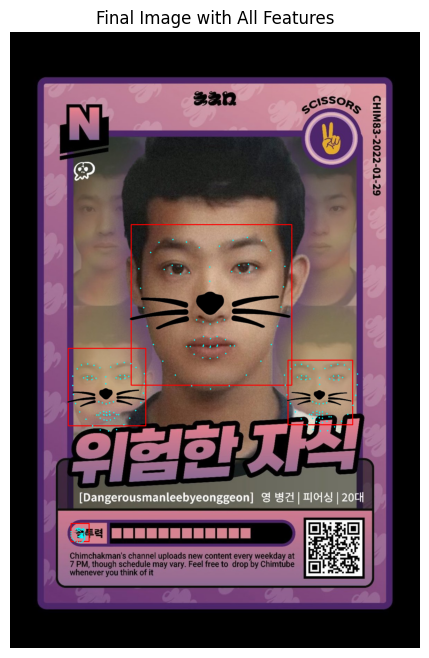

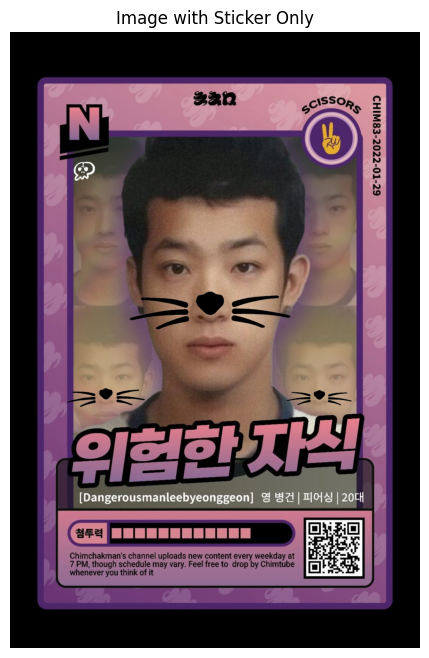

Processing: 1714320122551-oqq3pdlw08a.jpg


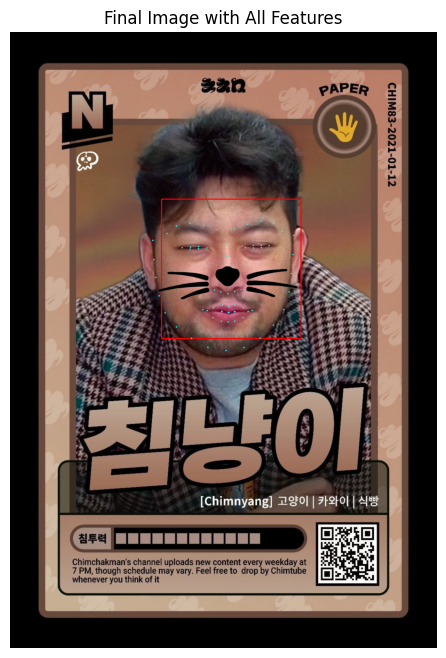

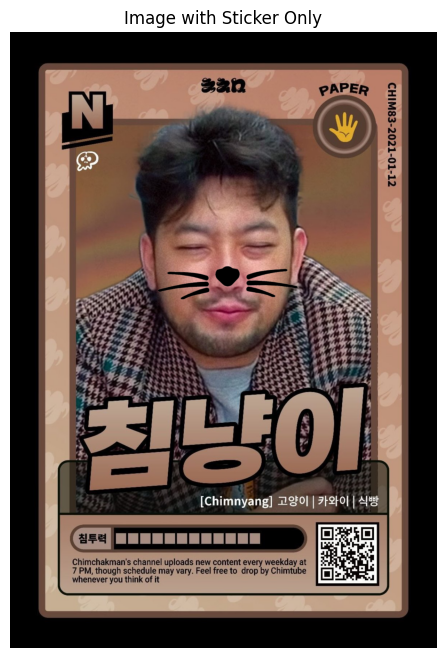

Processing: 1714320122983-jqv11okdyui.jpg


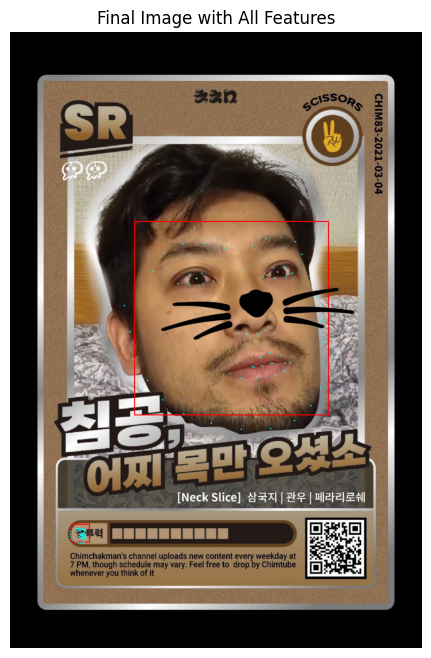

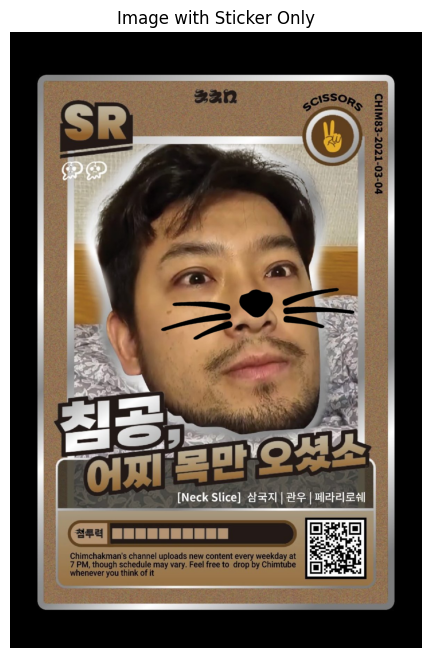

Processing: 1714320122922-vvktjzkka6b.jpg


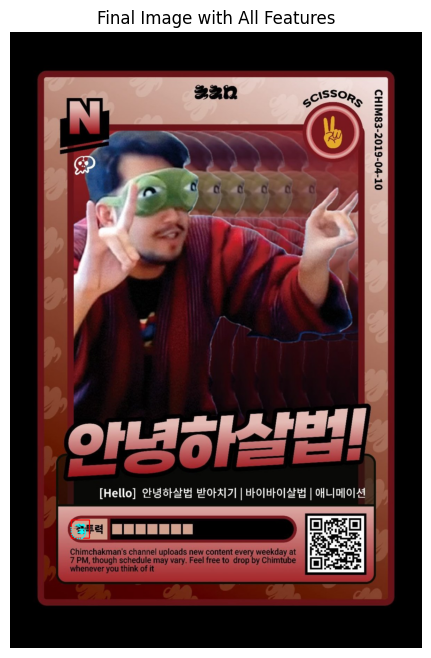

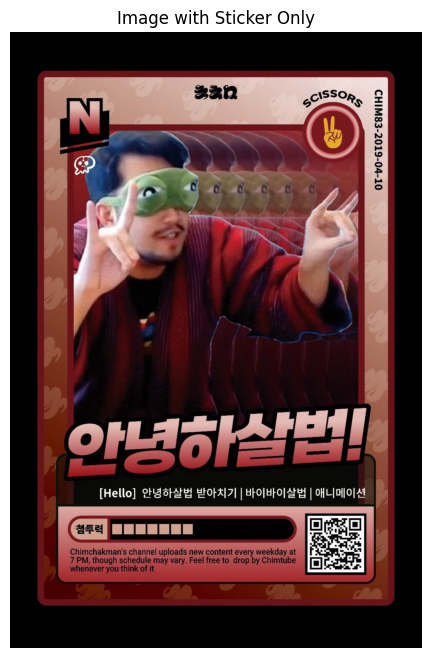

Processing: 1714320123000-qly7he1mwkh.jpg


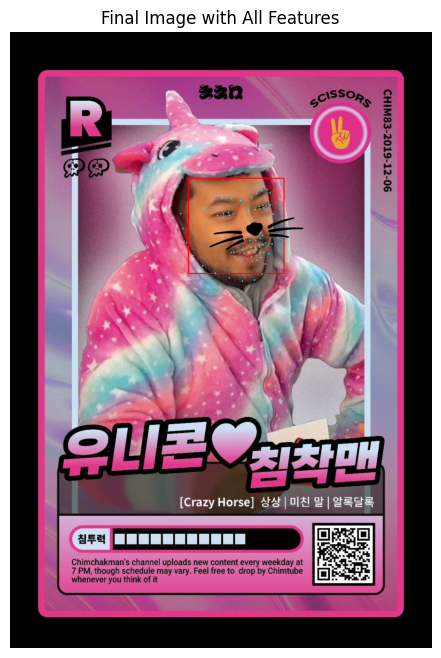

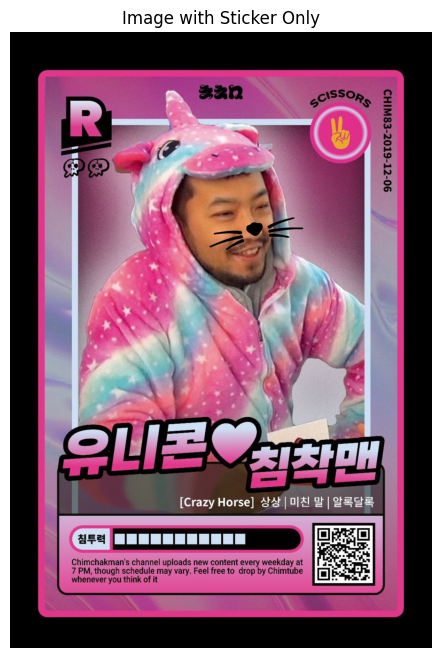

Processing: 1714320122574-pm14p3jawah.jpg


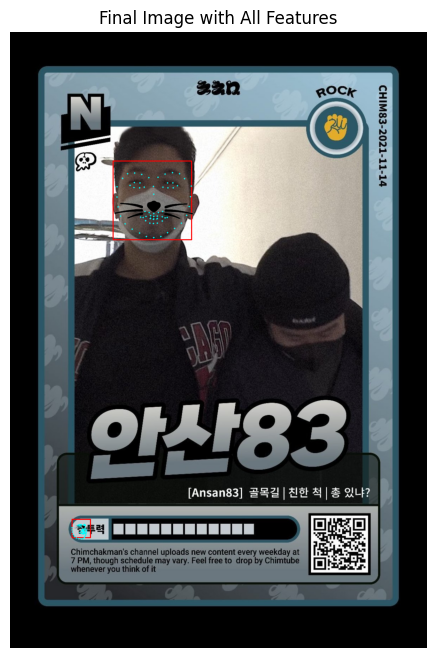

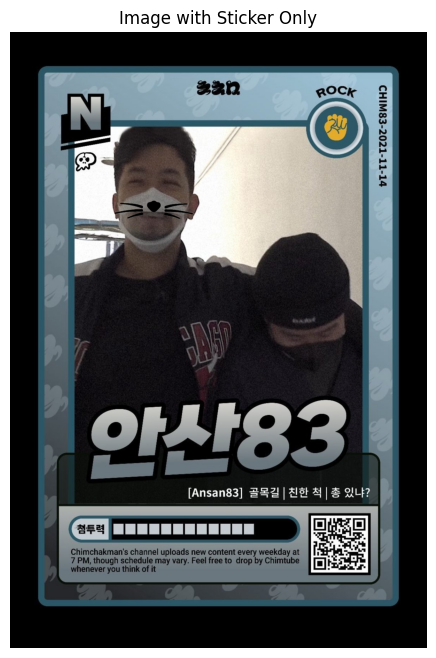

Processing: 7007290122_494354581_ac24b93febbf0f945090a1f583f8f8e6.jpg


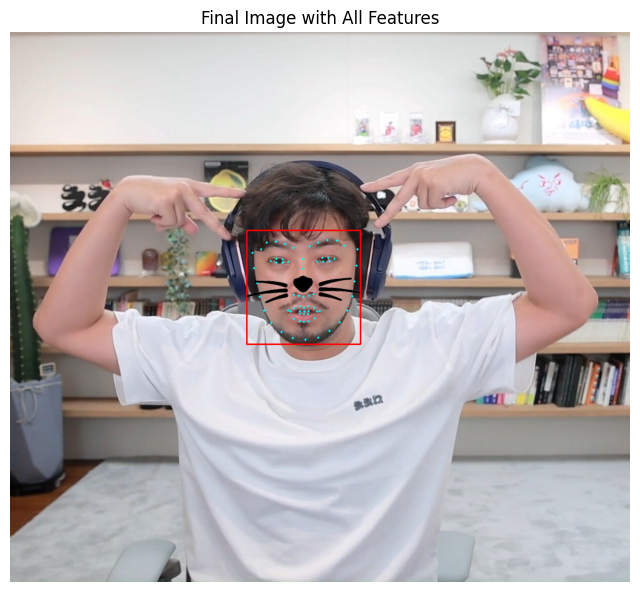

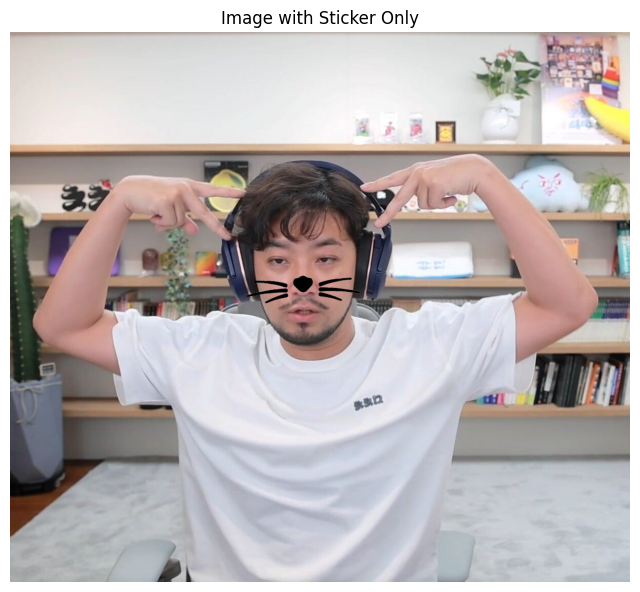

Processing: 1714320121712-sq3v20zq3nf.jpg


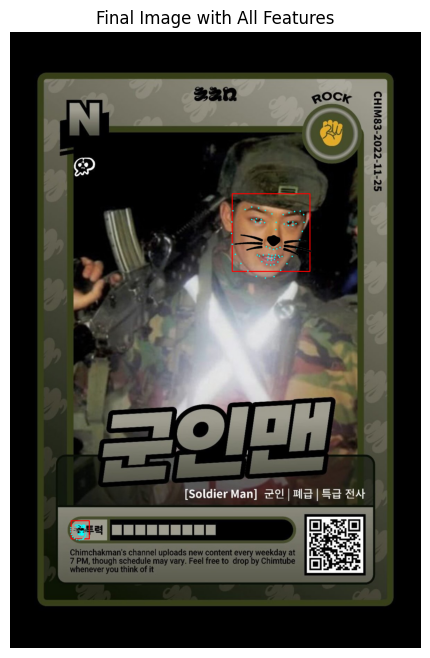

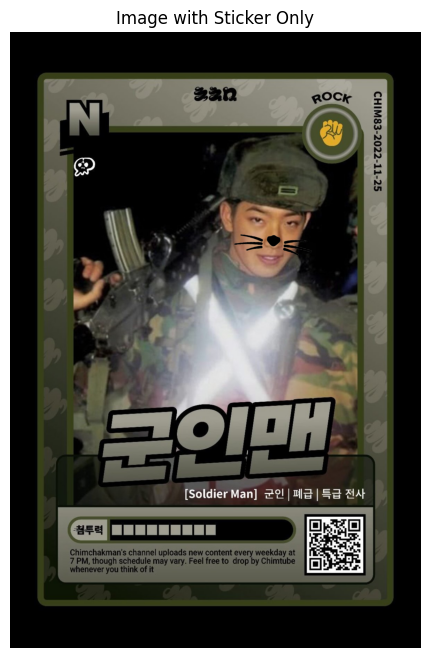

All images processed!


In [19]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib
from glob import glob

# 이미지 폴더와 스티커 경로 설정
img_folder = "/home/gnorm42/study_ipynb/aiffel_landmark/data/images"
sticker_path = "/home/gnorm42/study_ipynb/aiffel_landmark/data/cat-whiskers.png"

# 이미지 파일 리스트 가져오기 (jpg, jpeg, png 파일)
img_files = glob(os.path.join(img_folder, "*.[jJ][pP][gG]")) + \
            glob(os.path.join(img_folder, "*.[jJ][pP][eE][gG]")) + \
            glob(os.path.join(img_folder, "*.[pP][nN][gG]"))

# 얼굴 인식을 위한 dlib 객체 생성
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('/home/gnorm42/study_ipynb/aiffel_landmark/models/shape_predictor_68_face_landmarks.dat')

# 스티커 이미지 읽기 (한 번만)
img_sticker = cv2.imread(sticker_path, cv2.IMREAD_UNCHANGED)
img_sticker = cv2.cvtColor(img_sticker, cv2.COLOR_BGRA2RGBA)

# output 디렉토리 생성
os.makedirs("output", exist_ok=True)

# 각 이미지 처리
for img_path in img_files:
    print(f"Processing: {os.path.basename(img_path)}")
    
    # 이미지 읽기
    img_origin = cv2.imread(img_path)
    if img_origin is None:  # 이미지 로드 실패 시 스킵
        print(f"Failed to load image: {img_path}")
        continue
        
    img_rgb = cv2.cvtColor(img_origin, cv2.COLOR_BGR2RGB)

    # 얼굴 인식
    dlib_rects = detector(img_rgb, 1)
    
    if len(dlib_rects) == 0:  # 얼굴이 검출되지 않은 경우 스킵
        print(f"No face detected in: {img_path}")
        continue

    # 랜드마크 검출을 위한 리스트
    list_landmarks = []

    # 랜드마크 검출
    for dlib_rect in dlib_rects:
        points = predictor(img_rgb, dlib_rect)
        list_points = list(map(lambda p: [p.x, p.y], points.parts()))
        list_landmarks.append(list_points)

    # 이미지 복사
    img_main = img_rgb.copy()

    for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
        # 얼굴 영역 박스 그리기 (img_rgb에만)
        x = dlib_rect.left()
        y = dlib_rect.top()
        w = dlib_rect.right() - dlib_rect.left()
        h = dlib_rect.bottom() - dlib_rect.top()
        cv2.rectangle(img_rgb, (x,y), (x+w,y+h), (255,0,0), 2)

        # 랜드마크 점 그리기 (img_rgb에만)
        for point in landmark:
            cv2.circle(img_rgb, tuple(point), 2, (0,255,255), -1)

        # 스티커 적용 (img_rgb와 img_main 모두에)

        x = landmark[33][0]  # 코의 x좌표
        y = landmark[30][1]  # 코의 y좌표
        w = h = dlib_rect.width()  # 스티커 크기
        
        # 얼굴 각도 계산 (왼쪽 눈과 오른쪽 눈의 위치로 계산)
        left_eye = landmark[36]
        right_eye = landmark[45]
        
        dY = right_eye[1] - left_eye[1]
        dX = right_eye[0] - left_eye[0]
        angle = np.degrees(np.arctan2(dY, dX)) * -1
        
        # 스티커 리사이즈
        img_sticker_resized = cv2.resize(img_sticker, (w, h))
        
        # 회전을 위해 더 큰 캔버스 생성
        diagonal = int(np.sqrt(w*w + h*h))
        offset = (diagonal - w) // 2
        canvas = np.zeros((diagonal, diagonal, 4), dtype=np.uint8)
        canvas[offset:offset+h, offset:offset+w] = img_sticker_resized
        
        # 캔버스 중심으로 회전
        center = (diagonal//2, diagonal//2)
        rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
        img_sticker_rotated = cv2.warpAffine(canvas, rotation_matrix, (diagonal, diagonal), 
                                           flags=cv2.INTER_LINEAR, 
                                           borderMode=cv2.BORDER_CONSTANT, 
                                           borderValue=(0,0,0,0))
        
        # 원래 크기로 자르기
        start_y = (diagonal - h) // 2
        start_x = (diagonal - w) // 2
        img_sticker_rotated = img_sticker_rotated[start_y:start_y+h, start_x:start_x+w]
        
        # 스티커 적용 영역 계산
        y1, y2 = y - h//2, y + h//2
        x1, x2 = x - w//2, x + w//2
        
        # 이미지 범위 확인
        if x1 < 0: x1 = 0
        if y1 < 0: y1 = 0
        if x2 > img_rgb.shape[1]: x2 = img_rgb.shape[1]
        if y2 > img_rgb.shape[0]: y2 = img_rgb.shape[0]
        
        # 스티커 크기 조정
        sticker_area = img_sticker_rotated[0:y2-y1, 0:x2-x1]
        
        # 알파 채널이 있는 경우 마스크 생성
        if sticker_area.shape[2] == 4:
            alpha_channel = sticker_area[:, :, 3] / 255.0
            alpha_3channel = np.stack([alpha_channel, alpha_channel, alpha_channel], axis=2)
            
            # 스티커 적용
            img_rgb[y1:y2, x1:x2] = (1 - alpha_3channel) * img_rgb[y1:y2, x1:x2] + alpha_3channel * sticker_area[:, :, :3]
            img_main[y1:y2, x1:x2] = (1 - alpha_3channel) * img_main[y1:y2, x1:x2] + alpha_3channel * sticker_area[:, :, :3]

    # 결과 저장
    original_filename = os.path.basename(img_path)
    output_filename = f"st_{original_filename}"
    output_path = os.path.join("output", output_filename)
    cv2.imwrite(output_path, cv2.cvtColor(img_main, cv2.COLOR_RGB2BGR))

    # 결과 출력
    plt.figure(figsize=(8, 8))
    plt.title('Final Image with All Features')
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

    plt.figure(figsize=(8, 8))
    plt.title('Image with Sticker Only')
    plt.imshow(img_main)
    plt.axis('off')
    plt.show()

print("All images processed!") 

# 배경으로 흐릿하게 보이는 얼굴에도 적용 확인.   
# 마스크 착용시에도 정상 검출 및 적용 확인.  
# 눈이 가려지면 랜드마크 검출 실패 문제

야 눈이 가려져있으면 랜드마크 검출 어떤 짓을 해도 검출 못해?>

네, 눈이 가려져 있으면 dlib의 기본 얼굴 랜드마크 검출기가 제대로 작동하지 않는 경우가 많습니다. 이는 dlib의 68점 랜드마크 검출기가 다음과 같은 한계를 가지고 있기 때문입니다:
학습 데이터의 한계:
대부분 정면 얼굴, 눈이 잘 보이는 이미지로 학습됨
선글라스나 마스크 등으로 가려진 얼굴에 대한 학습 데이터가 부족
눈 주변 랜드마크의 중요성:
68점 랜드마크 중 눈 주변 포인트가 얼굴 정렬의 핵심 기준점
눈이 가려지면 다른 랜드마크도 부정확해짐
해결 방법으로는:
다른 랜드마크 검출기 사용:
MediaPipe Face Mesh (468개 랜드마크)
OpenCV의 DNN 기반 얼굴 랜드마크
더 강건한 상업용 API (예: AWS Rekognition)
눈 영역이 가려진 경우를 위한 별도 모델 학습
선글라스 착용 이미지로 fine-tuning
눈 영역을 제외한 랜드마크만 사용
현재 상황에서는 MediaPipe Face Mesh로 전환하는 것이 가장 실용적인 해결책이 될 수 있습니다. MediaPipe는 눈이 가려진 경우에도 더 안정적으로 작동하는 편입니다.

# 추후 개선
- 눈 가려짐 문제- 랜드마크 모델 변경 or face keypoint 모델 사용

# 움짤 재생 확인 완료. 주피터 노트북에서는 재생 안돼서 깃허브 같은 경로에 따로 올림

Processing: 1682398367608-vy0181283gj.gif


/tmp/ipykernel_64025/1940139651.py:102: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  img_result[y1:y2, x1:x2] = (1 - alpha_3channel) * img_result[y1:y2, x1:x2] + \


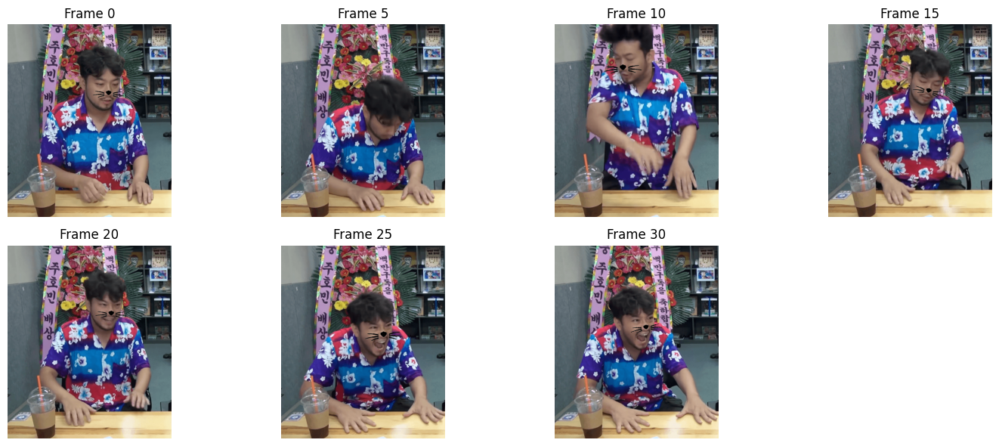

Processing: 1682398141403-gc0d13gs2a.gif


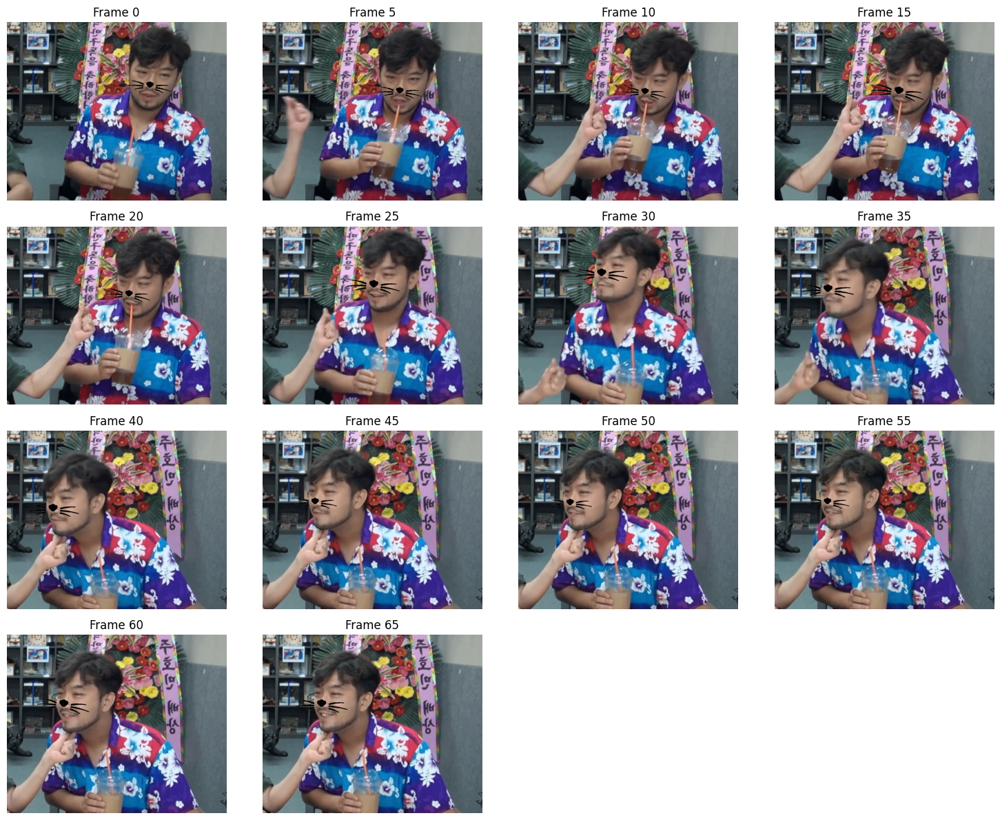

Processing: 1682398107352-g8usaalhpw.gif


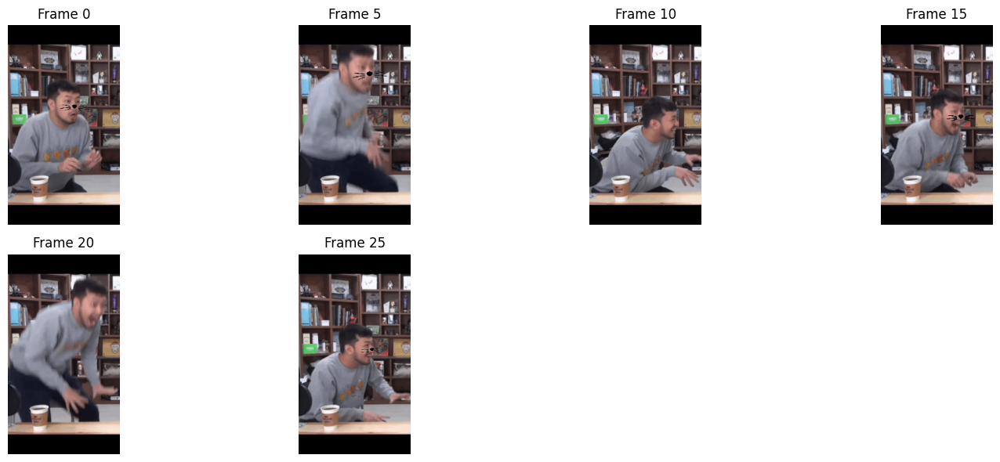

Processing: 1682398116259-0ke9jv9wis1.gif


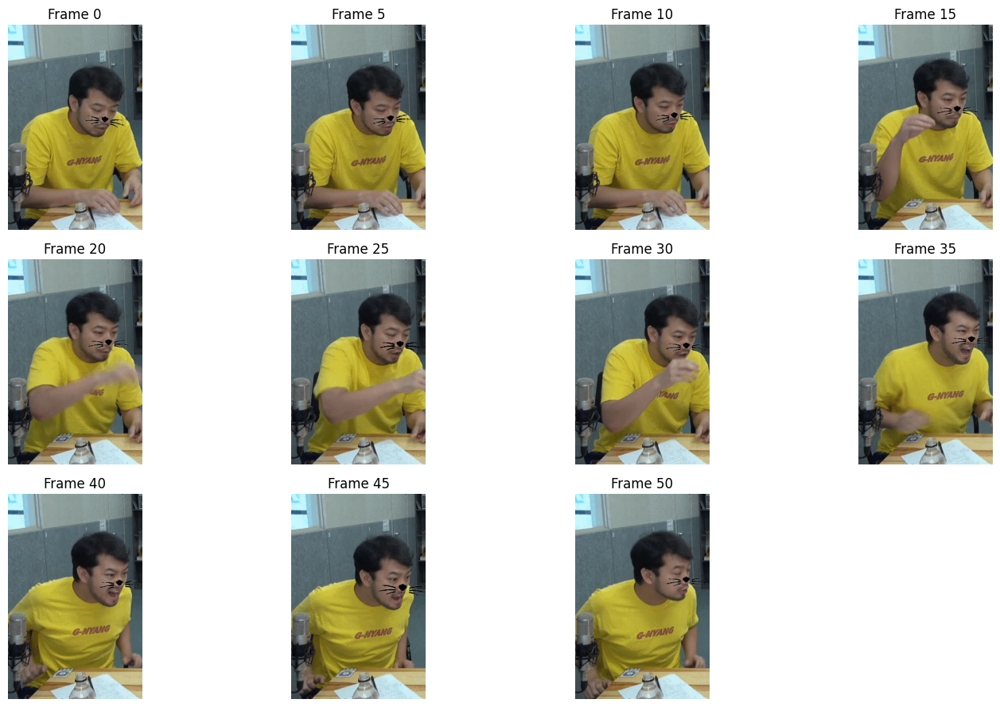

Processing: 1682398682084-ql42ufzk6u.gif


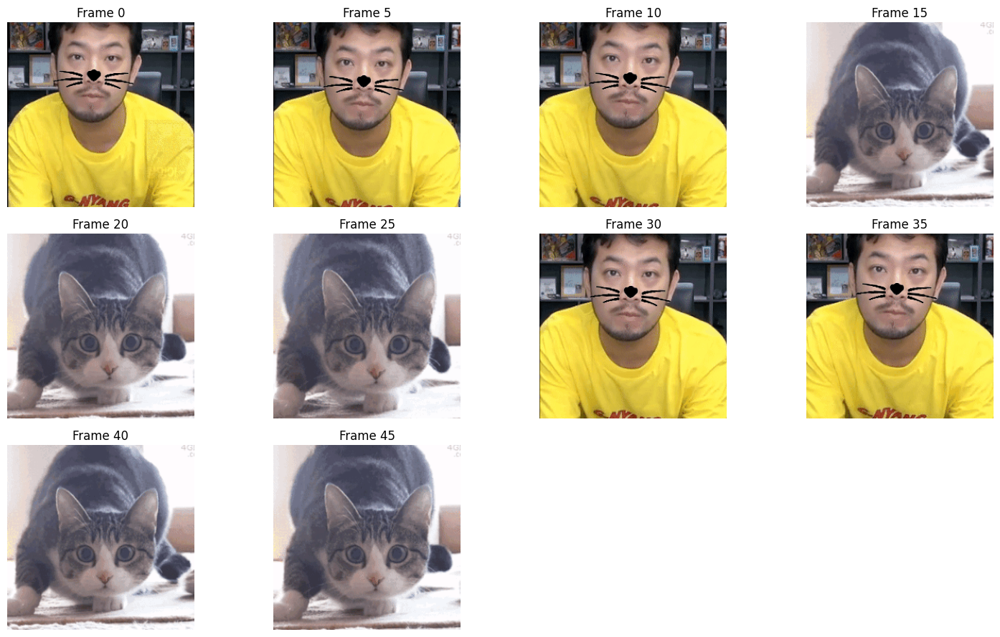

All images processed!


In [26]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib
from glob import glob
from PIL import Image
import imageio

# 이미지 폴더와 스티커 경로 설정
img_folder = "/home/gnorm42/study_ipynb/aiffel_landmark/data/gif"
sticker_path = "/home/gnorm42/study_ipynb/aiffel_landmark/data/cat-whiskers.png"

# 이미지 파일 리스트 가져오기 (jpg, jpeg, png, gif 파일)
img_files = glob(os.path.join(img_folder, "*.[jJ][pP][gG]")) + \
            glob(os.path.join(img_folder, "*.[jJ][pP][eE][gG]")) + \
            glob(os.path.join(img_folder, "*.[pP][nN][gG]")) + \
            glob(os.path.join(img_folder, "*.[gG][iI][fF]"))

# 얼굴 인식을 위한 dlib 객체 생성
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('/home/gnorm42/study_ipynb/aiffel_landmark/models/shape_predictor_68_face_landmarks.dat')

# 스티커 이미지 읽기 (한 번만)
img_sticker = cv2.imread(sticker_path, cv2.IMREAD_UNCHANGED)
img_sticker = cv2.cvtColor(img_sticker, cv2.COLOR_BGRA2RGBA)

# output 디렉토리 생성
os.makedirs("output", exist_ok=True)

def process_frame(frame):
    """한 프레임에 대한 처리를 수행하는 함수"""
    # BGR to RGB
    if len(frame.shape) == 2:  # 흑백 이미지인 경우
        frame = cv2.cvtColor(frame, cv2.COLOR_GRAY2RGB)
    elif frame.shape[2] == 4:  # RGBA 이미지인 경우
        frame = cv2.cvtColor(frame, cv2.COLOR_RGBA2RGB)
    
    # 얼굴 인식
    dlib_rects = detector(frame, 1)
    
    if len(dlib_rects) == 0:
        return frame  # 얼굴이 없으면 원본 반환
    
    # 결과 이미지 복사
    img_result = frame.copy()
    
    # 각 얼굴에 대해 처리
    for dlib_rect in dlib_rects:
        # 랜드마크 검출
        points = predictor(frame, dlib_rect)
        list_points = list(map(lambda p: [p.x, p.y], points.parts()))
        
        # 스티커 적용
        x = list_points[33][0]  # 코의 x좌표
        y = list_points[30][1]  # 코의 y좌표
        w = h = dlib_rect.width()
        
        # 얼굴 각도 계산
        left_eye = list_points[36]
        right_eye = list_points[45]
        dY = right_eye[1] - left_eye[1]
        dX = right_eye[0] - left_eye[0]
        angle = np.degrees(np.arctan2(dY, dX)) * -1
        
        # 스티커 리사이즈 및 회전
        img_sticker_resized = cv2.resize(img_sticker, (w, h))
        diagonal = int(np.sqrt(w*w + h*h))
        offset = (diagonal - w) // 2
        canvas = np.zeros((diagonal, diagonal, 4), dtype=np.uint8)
        canvas[offset:offset+h, offset:offset+w] = img_sticker_resized
        
        center = (diagonal//2, diagonal//2)
        rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
        img_sticker_rotated = cv2.warpAffine(canvas, rotation_matrix, (diagonal, diagonal),
                                           flags=cv2.INTER_LINEAR,
                                           borderMode=cv2.BORDER_CONSTANT,
                                           borderValue=(0,0,0,0))
        
        # 원래 크기로 자르기
        start_y = (diagonal - h) // 2
        start_x = (diagonal - w) // 2
        img_sticker_rotated = img_sticker_rotated[start_y:start_y+h, start_x:start_x+w]
        
        # 스티커 적용 영역 계산
        y1, y2 = y - h//2, y + h//2
        x1, x2 = x - w//2, x + w//2
        
        # 이미지 범위 확인
        if x1 < 0: x1 = 0
        if y1 < 0: y1 = 0
        if x2 > frame.shape[1]: x2 = frame.shape[1]
        if y2 > frame.shape[0]: y2 = frame.shape[0]
        
        # 스티커 크기 조정
        sticker_area = img_sticker_rotated[0:y2-y1, 0:x2-x1]
        
        # 알파 채널이 있는 경우 마스크 생성
        if sticker_area.shape[2] == 4:
            alpha_channel = sticker_area[:, :, 3] / 255.0
            alpha_3channel = np.stack([alpha_channel, alpha_channel, alpha_channel], axis=2)
            img_result[y1:y2, x1:x2] = (1 - alpha_3channel) * img_result[y1:y2, x1:x2] + \
                                      alpha_3channel * sticker_area[:, :, :3]
    
    return img_result

# 각 이미지 처리
for img_path in img_files:
    print(f"Processing: {os.path.basename(img_path)}")
    
    # 파일 확장자 확인
    _, ext = os.path.splitext(img_path)
    is_gif = ext.lower() == '.gif'
    
    if is_gif:
        try:
            # GIF 읽기
            gif_reader = imageio.get_reader(img_path)
            if gif_reader is None:
                print(f"Failed to load GIF: {img_path}")
                continue
            
            # 원본 메타데이터에서 duration 가져오기
            original_duration = gif_reader.get_meta_data().get('duration', 100) / 1000.0  # ms를 초 단위로 변환
            
            # 각 프레임 처리
            processed_frames = []
            for frame in gif_reader:
                # 프레임을 uint8로 변환
                frame = frame.astype(np.uint8)
                # 프레임 처리
                processed_frame = process_frame(frame)
                processed_frames.append(processed_frame)
            
            # 결과 GIF 저장
            output_filename = f"st_{os.path.basename(img_path)}"
            output_path = os.path.join("output", output_filename)
            
            # GIF 저장 설정 (원본 duration 사용)
            with imageio.get_writer(output_path, mode='I', duration=original_duration, loop=0) as writer:
                for frame in processed_frames:
                    writer.append_data(frame)
            
            # 프레임 수가 많을 경우 일부만 표시 (매 5프레임마다)
            display_interval = 5  # 몇 프레임당 하나씩 보여줄지 설정
            frames_to_display = processed_frames[::display_interval]
            
            # 프레임 배열로 표시
            n_frames = len(frames_to_display)
            n_cols = 4  # 한 줄에 보여줄 프레임 수
            n_rows = (n_frames + n_cols - 1) // n_cols  # 필요한 행 수 계산
            
            plt.figure(figsize=(15, 3*n_rows))  # 크기 조정
            for idx, frame in enumerate(frames_to_display):
                plt.subplot(n_rows, n_cols, idx + 1)
                plt.title(f'Frame {idx * display_interval}')
                plt.imshow(frame)
                plt.axis('off')
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Error processing GIF {img_path}: {str(e)}")
            continue
    else:
        # 일반 이미지 처리 (기존 코드)
        img_origin = cv2.imread(img_path)
        if img_origin is None:
            print(f"Failed to load image: {img_path}")
            continue
        
        img_rgb = cv2.cvtColor(img_origin, cv2.COLOR_BGR2RGB)
        img_result = process_frame(img_rgb)
        
        # 결과 저장
        output_filename = f"st_{os.path.basename(img_path)}"
        output_path = os.path.join("output", output_filename)
        cv2.imwrite(output_path, cv2.cvtColor(img_result, cv2.COLOR_RGB2BGR))
        
        # 결과 출력
        plt.figure(figsize=(8, 8))
        plt.title('Processed Image')
        plt.imshow(img_result)
        plt.axis('off')
        plt.show()

print("All images processed!") 